<a href="https://colab.research.google.com/github/sohak22/Fake-News-Detection/blob/main/Fake_News_Detection_using_LSTM_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

Exploring Fake News 

In [ ]:
fake= pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

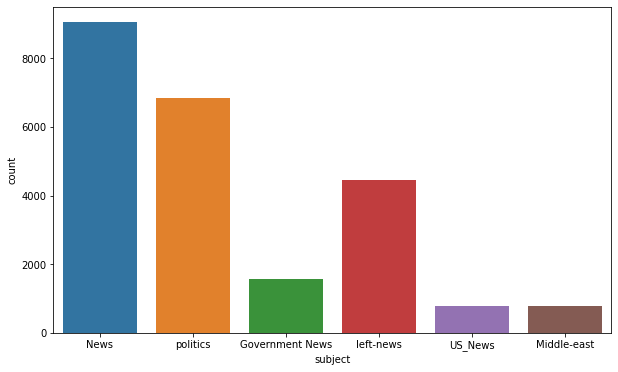

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='subject', data=fake)

WordCloud- Text Visualization 

In [ ]:
text=''.join(fake['text'].tolist())

<function matplotlib.pyplot.show>

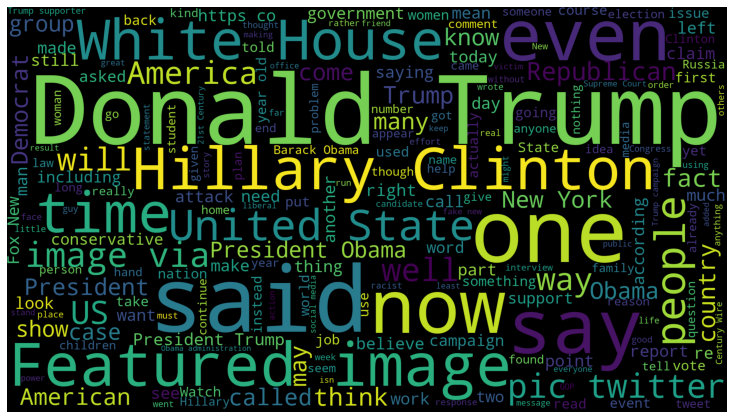

In [ ]:
wordcloud = WordCloud(width = 1920, height= 1080).generate(text)
fig = plt.figure(figsize=(10,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad= 0)
plt.show

Exploring Real News 



In [ ]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')
real.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [ ]:
text = ''.join(real['text'].tolist())

<function matplotlib.pyplot.show>

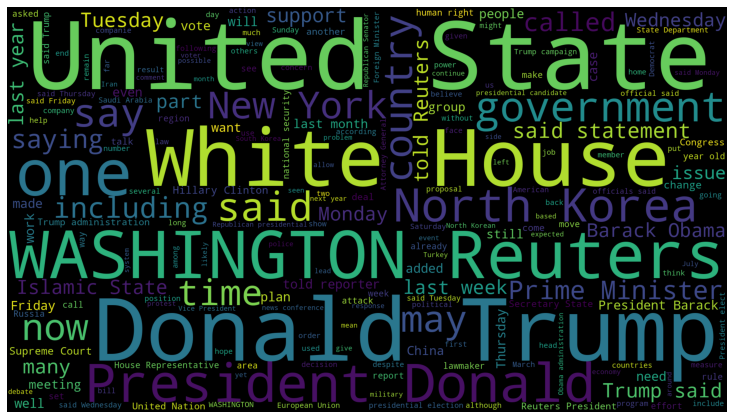

In [ ]:
wordcloud = WordCloud(width = 1920, height= 1080).generate(text)
fig = plt.figure(figsize=(10,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad= 0)
plt.show

Data Discussion
*   Real news has occurrences of Washington Reuters --> which is the source of the news
*   Few of the texts are from Twitter
*   Fake news does not have any publication data






Cleaning Data 


*   Remove Reuters or Twitter information from data:
  *   Text can be split at the "-" where the publication information is always listed aftwerwards 
  *   If no publication information given, no details were given 
    *   Tweets all come from twitter, max character length is 259 characters 








In [ ]:
unknown_publishers =[]
# iterate through text data and return index and row in data 
for index, row in enumerate(real.text.values):
  try: 
    record = row.split('-', maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)


In [ ]:
len(unknown_publishers) # 31 rows of text data have unknown publishers 

222

In [ ]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
real= real.drop(8970, axis=0) 
#removing empty row

In [ ]:
publisher = []
tmp_text = []

for index, row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')

  else:
    record = row.split('-', maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())


In [ ]:
real['publisher']=publisher
real['text']= tmp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21416, 5)

In [ ]:
empty_fake_index = [ index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text'] = real['title']+ " "+real['text']
fake['text'] = fake['title']+ " "+fake['text']

In [ ]:
real['text']= real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())


Preprocessing Text

In [ ]:
real['class'] = 1
fake['class'] = 0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
real = real[['text','class']]

In [ ]:
fake = fake[['text','class']]

In [ ]:
data = real.append(fake, ignore_index= True)

In [ ]:
data.sample(5)
#shows which news are real and fake in combined data set

,text,class
15998,egypt says bombs militants responsible for wes...,1
36298,what gives? saudi king spends a fortune in 201...,0
12300,in-flight sexual assaults often unreported; ai...,1
22373,trump gets humiliated after whining about sta...,0
2500,trump's nominee for fed says banking rules nee...,1


In [ ]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall



In [ ]:
import preprocess_kgptalkie as ps


In [ ]:
data['text']= data['text'].apply(lambda x: ps.remove_special_chars(x))

Vectorization: Convert text data to numeric values 

[Explanation of Word2Vec](https://jalammar.github.io/illustrated-word2vec/)



In [ ]:
import gensim

In [ ]:
y = data['class'].values

In [ ]:
X = [d.split() for d in data['text'].tolist()]

In [ ]:
type(X[0])

list

In [ ]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X, size= DIM, window= 10, min_count=1)

In [ ]:
len(w2v_model.wv.vocab)

231872

In [ ]:
w2v_model.wv.vocab

{'as': <gensim.models.keyedvectors.Vocab at 0x7fcf41ffabd0>,
 'us': <gensim.models.keyedvectors.Vocab at 0x7fced0838650>,
 'budget': <gensim.models.keyedvectors.Vocab at 0x7fced0838190>,
 'fight': <gensim.models.keyedvectors.Vocab at 0x7fced0764b50>,
 'looms': <gensim.models.keyedvectors.Vocab at 0x7fced0764490>,
 'republicans': <gensim.models.keyedvectors.Vocab at 0x7fced068e250>,
 'flip': <gensim.models.keyedvectors.Vocab at 0x7fced068e290>,
 'their': <gensim.models.keyedvectors.Vocab at 0x7fced068e210>,
 'fiscal': <gensim.models.keyedvectors.Vocab at 0x7fced07643d0>,
 'script': <gensim.models.keyedvectors.Vocab at 0x7fced068ee50>,
 'the': <gensim.models.keyedvectors.Vocab at 0x7fced068e2d0>,
 'head': <gensim.models.keyedvectors.Vocab at 0x7fced068e190>,
 'of': <gensim.models.keyedvectors.Vocab at 0x7fced087fc50>,
 'a': <gensim.models.keyedvectors.Vocab at 0x7fced0689390>,
 'conservative': <gensim.models.keyedvectors.Vocab at 0x7fced0689250>,
 'republican': <gensim.models.keyedvector

In [ ]:
w2v_model.wv['happy']
# shows the converted types 

In [ ]:
w2v_model.wv.most_similar('canada')
#these are the types that show up with 'canada' most often in the data set 

[('australia', 0.7132468819618225),
 ('canadian', 0.6948370337486267),
 ('nafta', 0.6600035429000854),
 ('mexico', 0.6471972465515137),
 ('lumber', 0.6207971572875977),
 ('softwood', 0.6150071620941162),
 ('canadas', 0.6070486307144165),
 ('denmark', 0.5973288416862488),
 ('norway', 0.5819784998893738),
 ('greece', 0.5765113830566406)]

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [ ]:
tokenizer.word_index

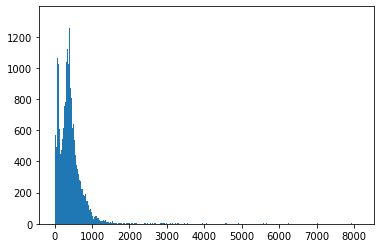

In [ ]:
plt.hist([len(x) for x in X ], bins = 700)
plt.show()

In [ ]:
nos = np.array([len(x) for x in X ])
len(nos[nos>1000])
#amount that have more than 100 words

1581

In [ ]:
maxlen = 1000
X= pad_sequences(X, maxlen=maxlen)

In [ ]:
len(X[10])

1000

In [ ]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [ ]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size, DIM))

  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix
  

In [ ]:
embedding_vectors = get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

(231873, 100)

In [ ]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim = DIM, weights = [embedding_vectors], input_length=maxlen, trainable = False))
model.add(LSTM(units = 128))
model.add(Dense(1, activation= 'sigmoid'))
model.compile(optimizer ='adam', loss = 'binary_crossentropy', metrics = ['acc'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 1000, 100)         23187300  
_________________________________________________________________
lstm (LSTM)                  (None, 128)               117248    
_________________________________________________________________
dense (Dense)                (None, 1)                 129       
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [ ]:
model.fit(X_train, y_train, validation_split=0.3, epochs= 6)

Epoch 1/6
737/737 [==============================] - 51s 58ms/step - loss: 0.1836 - acc: 0.9306 - val_loss: 0.1072 - val_acc: 0.9641
Epoch 2/6
737/737 [==============================] - 42s 57ms/step - loss: 0.0904 - acc: 0.9674 - val_loss: 0.0493 - val_acc: 0.9827
Epoch 3/6
737/737 [==============================] - 43s 59ms/step - loss: 0.0548 - acc: 0.9812 - val_loss: 0.0397 - val_acc: 0.9864
Epoch 4/6
737/737 [==============================] - 41s 56ms/step - loss: 0.0386 - acc: 0.9870 - val_loss: 0.0587 - val_acc: 0.9792
Epoch 5/6
737/737 [==============================] - 42s 57ms/step - loss: 0.0235 - acc: 0.9922 - val_loss: 0.0244 - val_acc: 0.9927
Epoch 6/6
737/737 [==============================] - 43s 58ms/step - loss: 0.0147 - acc: 0.9952 - val_loss: 0.0263 - val_acc: 0.9920


In [ ]:
y_pred = (model.predict(X_test) >= 0.5).astype(int)

In [ ]:
accuracy_score(y_test, y_pred)

0.9907349665924277

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5842
           1       0.99      0.99      0.99      5383

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [ ]:
x = ['this is random news, am I real?']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)

In [ ]:
X_test

array([[     0,      0,      0, ...,      5, 102821,    978],
       [     0,      0,      0, ...,   4053,    175,   1097],
       [     0,      0,      0, ...,  27144,    478,    264],
       ...,
       [     0,      0,      0, ...,      8,    317,    118],
       [     0,      0,      0, ...,    939,     28,    143],
       [     0,      0,      0, ...,      3,   1639,    199]], dtype=int32)

In [ ]:
(model.predict(x) >= 0.5).astype(int)
#returns 0, meaning it is fake news which it is as I just made up that statement

array([[0]])

In [ ]:
y = ['Biden on July 9 signed a sweeping executive order aimed at limiting corporate dominance and encouraging more competitive policies across a range of industries, including ocean shipping, health care, transportation and technology. ']
#source: https://nationalpost.com/news/canada/bidens-push-for-competition-could-dampen-canadas-post-pandemic-recovery-industry-warns
y = tokenizer.texts_to_sequences(y)
y  = pad_sequences(y, maxlen=maxlen)
(model.predict(y) >= 0.5).astype(int)
#shows it is real news and not fake news, showcasing the accuracy of this model

array([[1]])